## PCLS: mesenchyme figures

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib import rcParams

# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 3               
sc.logging.print_version_and_date()

# making sure plots & clusters are reproducible
np.random.seed(42)

# custom functions
import sc_toolbox as sct

Running Scanpy 1.8.2, on 2022-10-02 11:22.


In [2]:
## path variables
adata_dir = '/home/niklas/projects/niche_environments_FIBROSIS/PCLS_human/01_data/ASK_joint/subsets/'
project_dir = '/home/niklas/projects/niche_environments_FIBROSIS/PCLS_human/01_data/ASK_joint/'

In [3]:
## plotting variables
fig_dir = '/home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/mesenchyme_subset/'
sc.settings.figdir = fig_dir
sc.set_figure_params(vector_friendly = True)
plt.rcParams['figure.figsize'] = (6, 5)
plt.rcParams['pdf.fonttype'] = 42

In [4]:
## load anndata object
adata = sc.read(adata_dir + '211201_mesenchyme_subset_NIKLAS_annotated.h5ad')

In [5]:
## have a look at the adata object
adata

AnnData object with n_obs × n_vars = 20761 × 16458
    obs: 'condition', 'modality', 'name', 'patient', 'timepoint', 'treatment', 'identifier', 'n_counts', 'n_genes', 'percent_mito', 'QC_group', 'doublet_scores', 'size_factors', 'leiden_1', 'leiden_2', 'd_cluster', 'sub_leiden_1', 'sub_leiden_2', 'auto_cell_type', 'Fibroblast_score', 'Myofibroblast_score', 'SMC_score', 'Pericytes_score', 'cell_type', 'cell_type_group'
    var: 'n_cells', 'n_counts', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'auto_cell_type_colors', 'cell_type_colors', 'cell_type_group_colors', 'condition_colors', 'd_cluster_colors', 'dendrogram_cell_type', 'dendrogram_sub_leiden_2', 'hvg', 'identifier_colors', 'leiden', 'leiden_1_colors', 'leiden_2_colors', 'name_colors', 'neighbors', 'patient_colors', 'pca', 'rank_genes_groups', 'sub_leiden_1_colors', 'sub_leiden_2_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
  

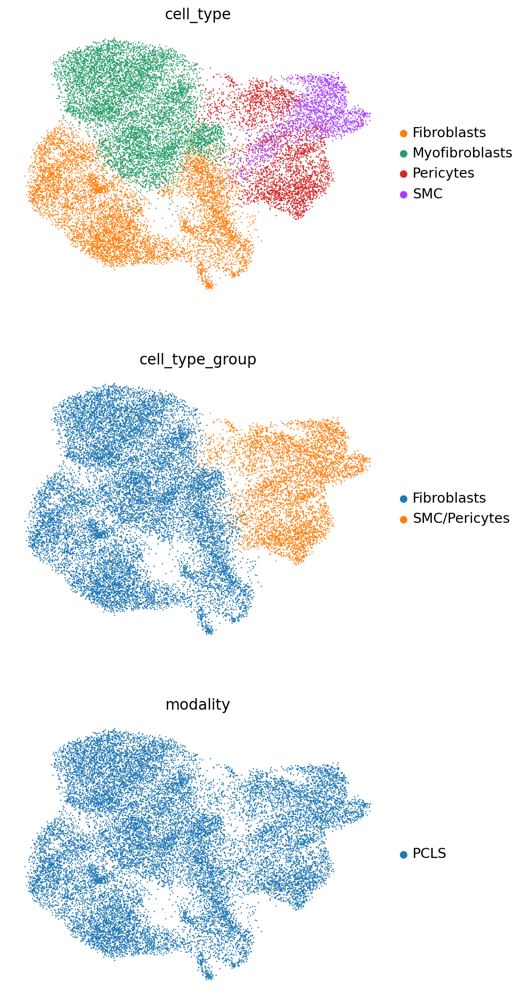

In [7]:
## overview UMAPs
sc.pl.umap(adata, color = ['cell_type',
                           'cell_type_group',
                           'modality'], ncols = 1, frameon = False)

In [8]:
## subset data: we only want to show CC and FC in the main figure
adata = adata[adata.obs.treatment.isin(['CC','FC'])].copy()

### Re-calculate HVGs

In [9]:
## delete all obs colums related to highly variable genes
del(adata.var['highly_variable'])
del(adata.var['highly_variable_nbatches'])
del(adata.var['highly_variable_intersection'])

In [10]:
## filter genes
sc.pp.filter_genes(adata, min_counts = 1)
sc.pp.filter_genes(adata, min_cells = 5)

filtered out 427 genes that are detected in less than 1 counts
filtered out 1059 genes that are detected in less than 5 cells


extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/niklas/miniconda3/envs/niche_fibrosis_env/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/home/niklas/miniconda3/envs/niche_fibrosis_env/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:>

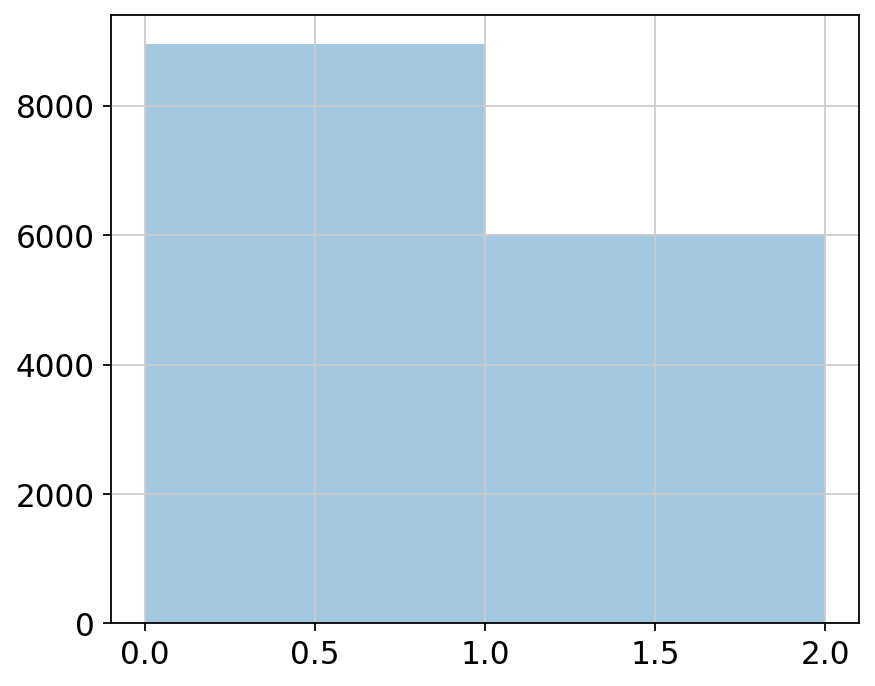

In [11]:
## compute HVGs per batch ('identifier') using seurat method
batch = 'patient'
sc.pp.highly_variable_genes(adata, min_disp = None, max_disp = None, min_mean = None, max_mean = None, 
                                batch_key = batch, n_top_genes = 4000, n_bins = 20, flavor = 'seurat', 
                                subset = False)
vartab = pd.DataFrame(adata.var['highly_variable_nbatches'], index = adata.var_names)
sb.distplot(vartab, kde = False, bins = len(np.unique(adata.obs[batch])))

In [12]:
## only consider a gene as variable if variable in at least 10 batches
thresh = 2
hvgs = vartab[vartab.highly_variable_nbatches.values >= thresh].index
print('%s Genes kept, variable in at least %s samples' %(len(hvgs), thresh))

1979 Genes kept, variable in at least 2 samples


In [13]:
## remove cell cycle genes (MOUSE) from list of HVGs
all_cc_genes = pd.read_table('/home/niklas/data/gene_lists/macosko_cell_cycle_genes.txt', header=0)
cc_genes = np.concatenate([all_cc_genes['IG1.S'], all_cc_genes['S'], all_cc_genes['G2.M'], all_cc_genes['M'], all_cc_genes['M.G1']]).astype(str)
cc_genes = [cc_genes[i] for i in np.arange(0,len(cc_genes))]
hvgs = np.setdiff1d(hvgs, cc_genes)

In [14]:
## set HVGs
adata.var['highly_variable'] = [g in hvgs for g in adata.var_names]
## no. of resulting HVGs
sum(adata.var['highly_variable'])

1902

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


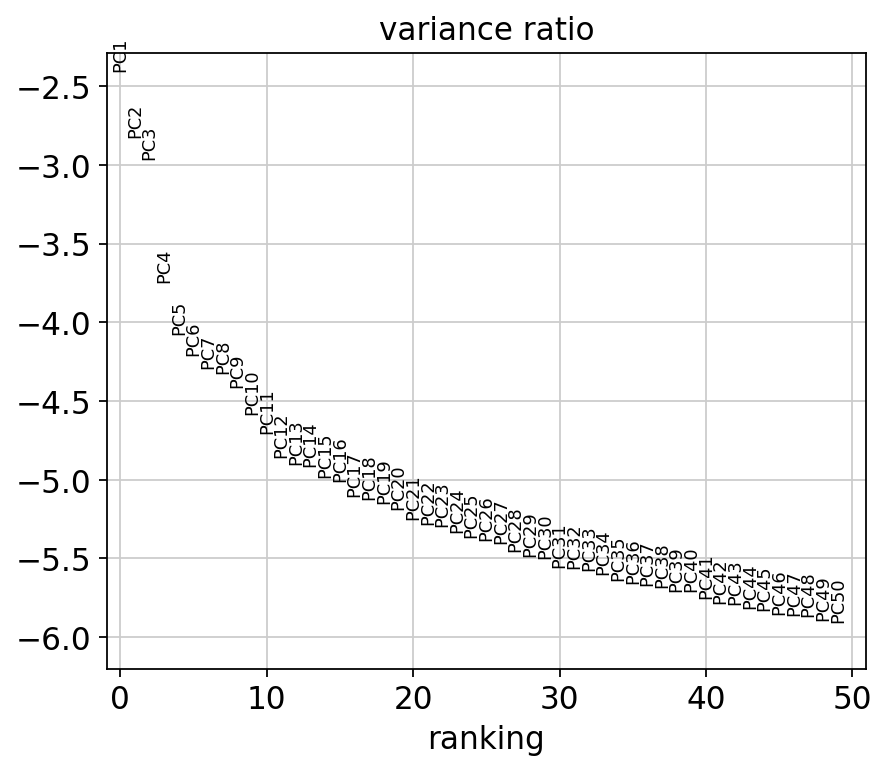

In [15]:
## PCA
sc.pp.pca(adata, use_highly_variable = True)
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:02:13)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


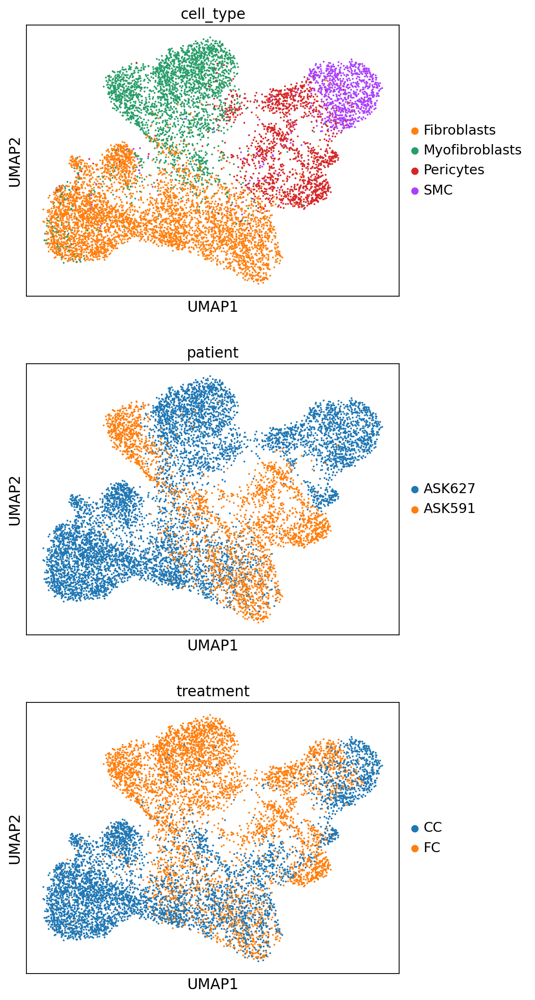

In [16]:
## graph based clustering
sc.pp.neighbors(adata, n_pcs = 50, n_neighbors = 50)
sc.tl.umap(adata)
sc.pl.umap(adata, color = ['cell_type',
                           'patient',
                           'treatment'], ncols = 1)

### Save figures

In [17]:
treatment_colors = {'CC' : '#87CEFA', # CC
                    'FC' : '#32145E', # FC
                    'FC+Nintedanib' : '#D03833', # Nintedanib
                    'FC+CMP4' : '#F6991C', # CMP4
                   }

In [18]:
ct_colors = sb.color_palette()

In [19]:
def mysize(w, h, d):
    fig, ax = plt.subplots(figsize = (w, h), dpi = d)
    return(fig.gca())

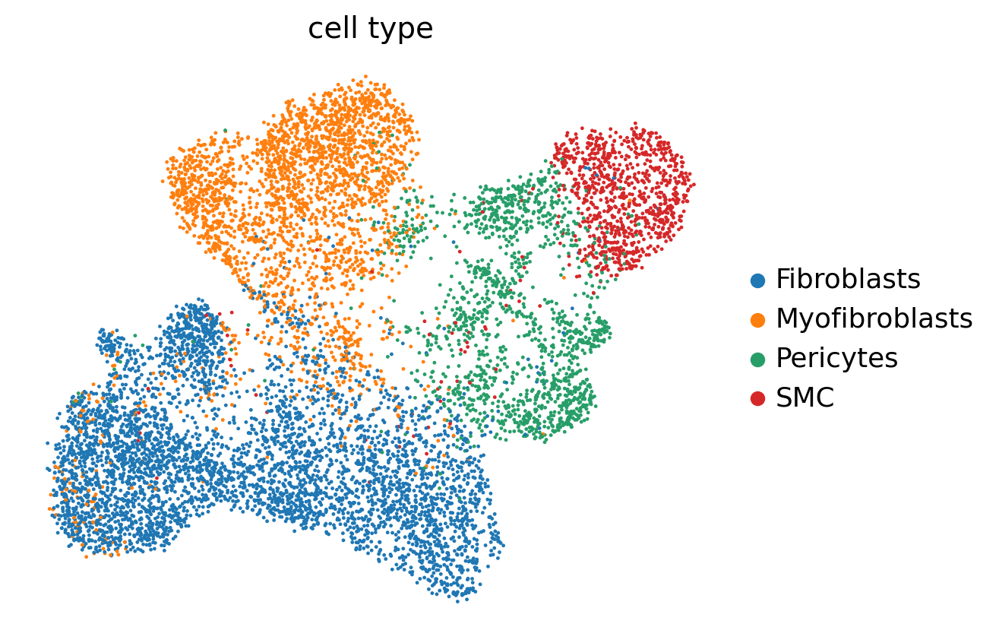

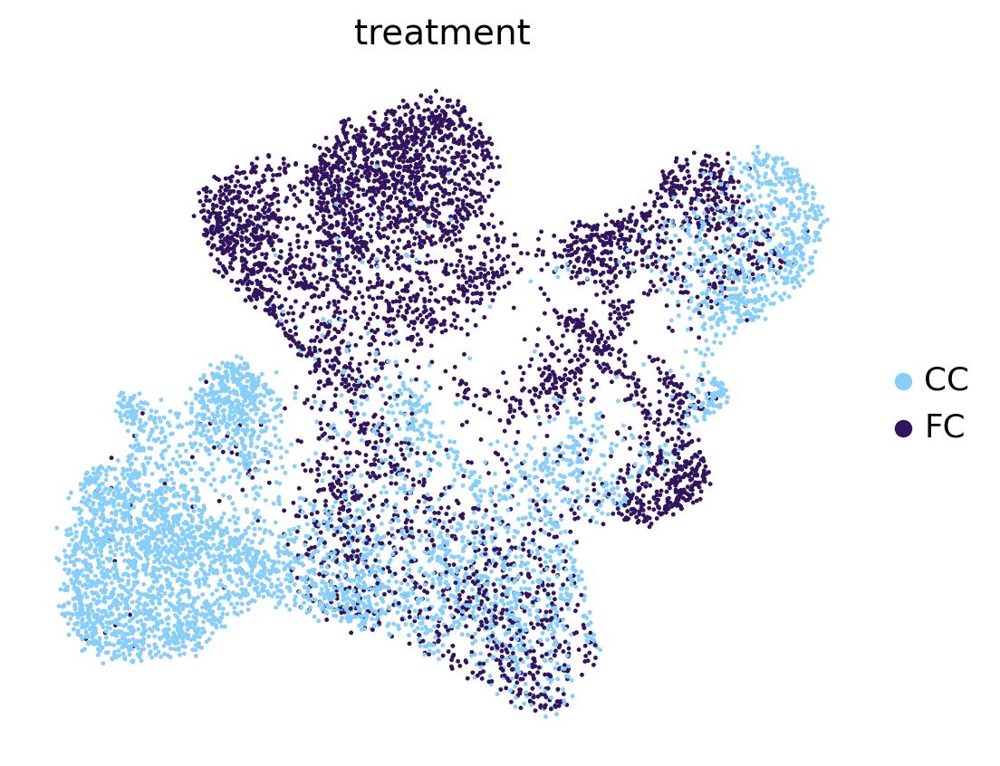

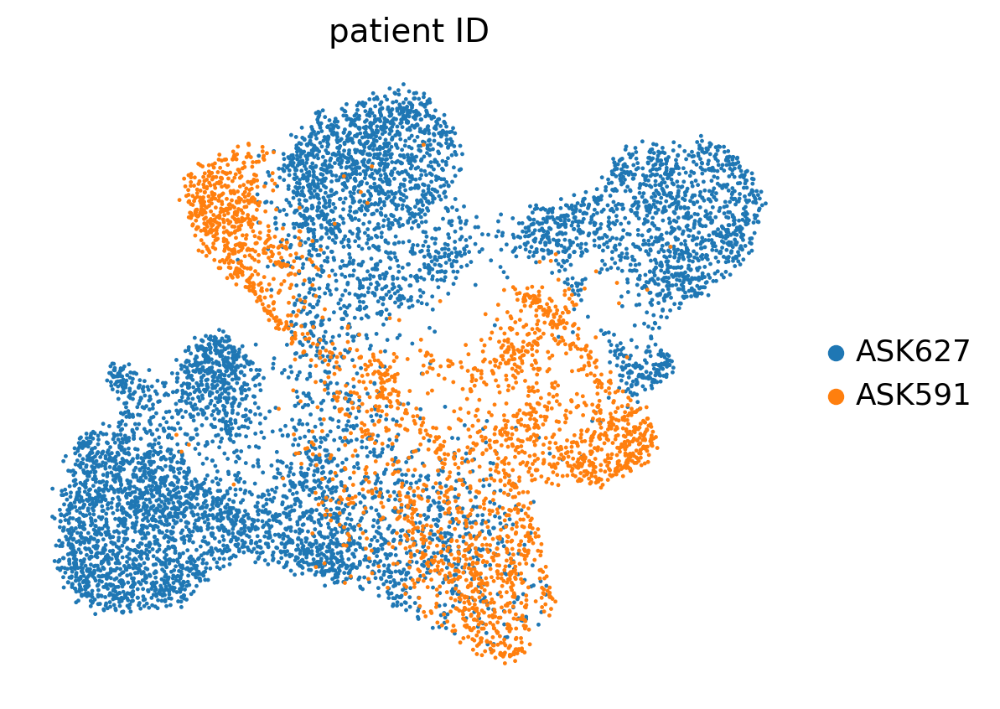

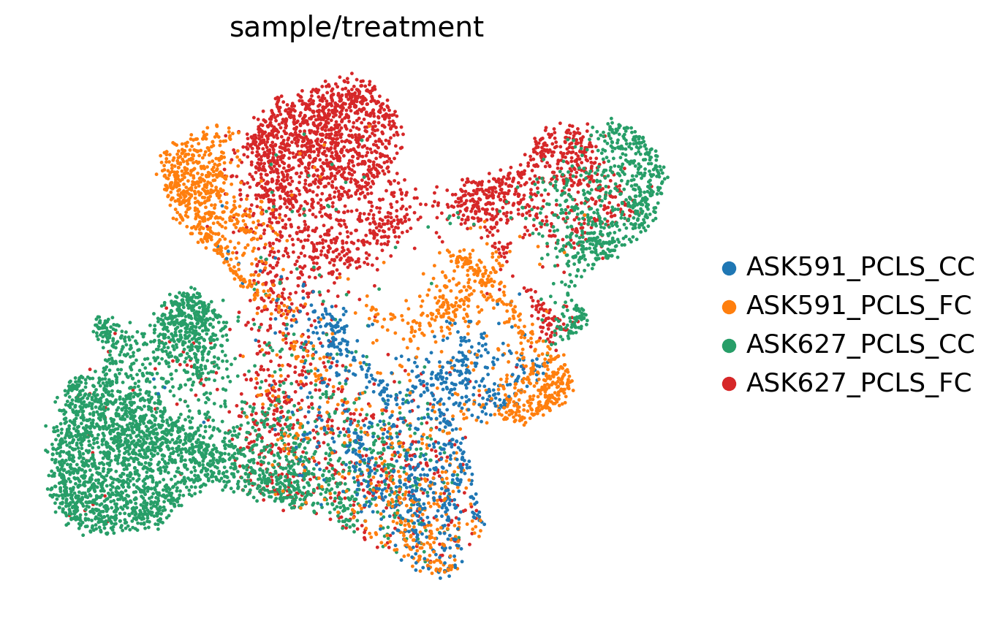

In [20]:
## cell type
sc.pl.umap(adata, color = ['cell_type'], title = 'cell type', frameon = False,
           palette = ct_colors,
           ax = mysize(6, 5, 100), size = 12, save = '_celltype.pdf')
## treatment
sc.pl.umap(adata, color = ['treatment'], title = 'treatment', frameon = False, 
           palette = treatment_colors, 
           ax = mysize(6, 5, 100), size = 12, save = '_treatment.pdf')
## patient / sample ID
sc.pl.umap(adata, color = ['patient'], title = 'patient ID', frameon = False,
           ax = mysize(6, 5, 100), size = 12, save = '_ASK_identifier.pdf')                           
## sample/treament
sc.pl.umap(adata, color = ['name'], title = 'sample/treatment', frameon = False,
           palette = ct_colors,
           ax = mysize(6, 5, 100), size = 12, save = '_sample_treatment.pdf')

In [21]:
## frequency table
xlabel = 'name'
cell_types_label = 'cell_type'
cols = adata.uns['%s_colors' %cell_types_label]
celltypes = adata.obs[cell_types_label].cat.categories

relFreqs = sct.calc.relative_frequencies(adata, group_by = cell_types_label, xlabel = xlabel, condition = None)
relFreqs.head(2)

,Fibroblasts,Myofibroblasts,Pericytes,SMC,name
muc24271,0.246835,0.379747,0.364557,0.008861,ASK591_PCLS_FC
muc24272,0.599341,0.138310,0.259056,0.003293,ASK591_PCLS_CC


In [22]:
order = ['ASK591_PCLS_CC',
         'ASK591_PCLS_FC',
         'ASK627_PCLS_CC',
         'ASK627_PCLS_FC'
        ]

Saving Figure to /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/AS
K_joint/mesenchyme_subset/rel_freqs.pdf

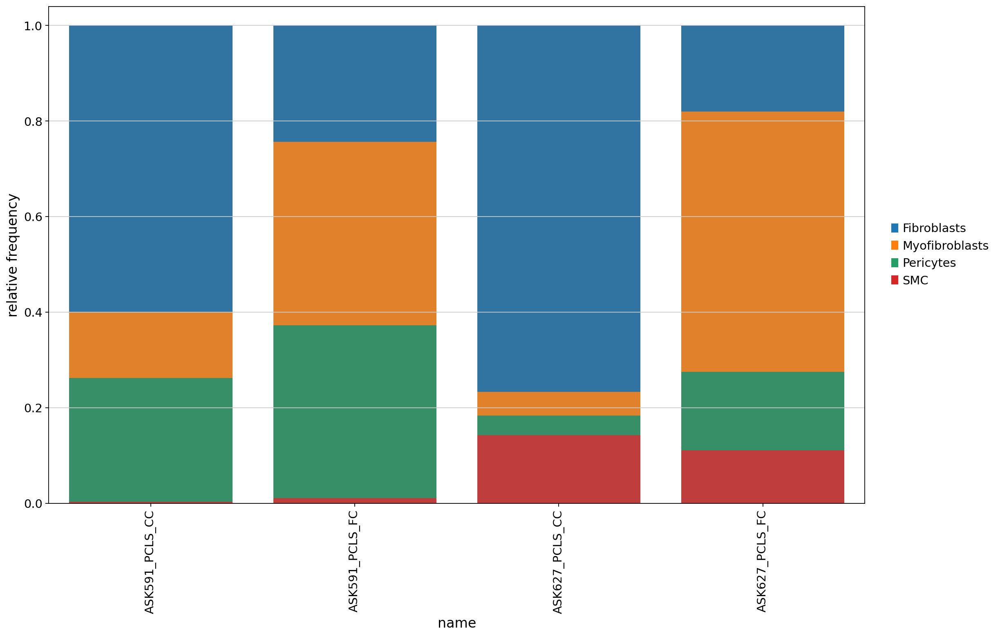

In [23]:
## cell type frequencies per treatment category
sct.plot.cluster_composition_stacked_barplot(relFreqs, xlabel = xlabel, figsize = (16,10), order = order,
                              colors = list(cols), width = 0.8,
                              save = '/home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/mesenchyme_subset/rel_freqs.pdf')

In [24]:
## automated heatmap
sc.tl.dendrogram(adata, groupby = 'cell_type')
sc.tl.rank_genes_groups(adata, groupby = 'cell_type', groups = 'all', use_raw = True, method = 'wilcoxon', n_genes=500)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cell_type']`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)


In [25]:
## create marker table
result = adata.uns['rank_genes_groups']
allMarkers = []
for cluster in result['names'].dtype.names:
    current = pd.DataFrame({'gene': result['names'][cluster], 'score': result['scores'][cluster],
                            'logfoldchange': result['logfoldchanges'][cluster], 'pval': result['pvals'][cluster],
                            'pval_adj': result['pvals_adj'][cluster], 'cell_type': cluster})
    allMarkers.append(current)
allMarkers = pd.concat(allMarkers)
allMarkers.head()

,gene,score,logfoldchange,pval,pval_adj,cell_type
0,FTL,56.508823,8.280724,0.000000e+00,0.000000e+00,Fibroblasts
1,RPL13A,31.826258,0.862635,2.805215e-222,9.940912e-220,Fibroblasts
2,SLC3A2,27.382225,1.835020,4.465628e-165,9.723770e-163,Fibroblasts
3,ANXA1,26.141462,1.775984,1.232426e-150,2.344592e-148,Fibroblasts
4,MGST1,25.252201,1.757941,1.071239e-140,1.809392e-138,Fibroblasts


In [26]:
## sort marker gene table by log FC and adjusted FC
allMarkers = allMarkers.sort_values(['cell_type','logfoldchange','score'], ascending=[True,False,True])
allMarkers.head()

,gene,score,logfoldchange,pval,pval_adj,cell_type
0,FTL,56.508823,8.280724,0.000000,0.000000,Fibroblasts
485,CD36,1.616300,6.334771,0.106030,0.220413,Fibroblasts
363,NEDD4L,2.534640,5.732149,0.011256,0.028056,Fibroblasts
377,STON2,2.449157,5.329705,0.014319,0.035043,Fibroblasts
480,CALCRL,1.629830,5.307028,0.103138,0.215119,Fibroblasts


In [27]:
## save marker table
out_dir = '/home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/01_data/'
allMarkers.to_csv(out_dir + '220128_PCLS_human_ASK_joint_mesenchyme_marker_table.csv', index = False)

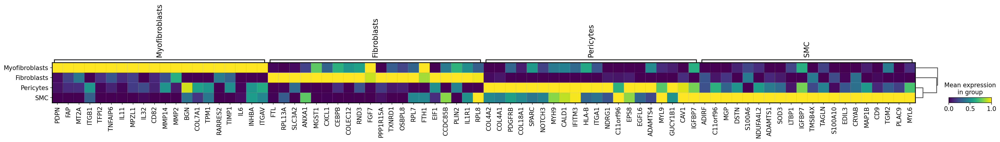

In [28]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes = 20, standard_scale = 'var', save= 'auto_markers.pdf')

In [29]:
celltype_markers={'Fibroblasts' : ['TCF21','PLIN2','CXCL1','ODC1','FGF10','COLEC12','EIF1','NFIL3'],
                  'Myofibroblasts' : ['PDPN','IL11','MMP9','FAP','CTHRC1','TNC','CXCL8','IL32','WNT5A','MMP2'],
                  'Pericytes' : ['KCNK3','CDH6','COX4I2','PDGFRB','CCDC102B','NDRG1'],
                  'SMC' : ['ACTG2','ACTA2','MYH11','PLN','DES','TNNT2']
}

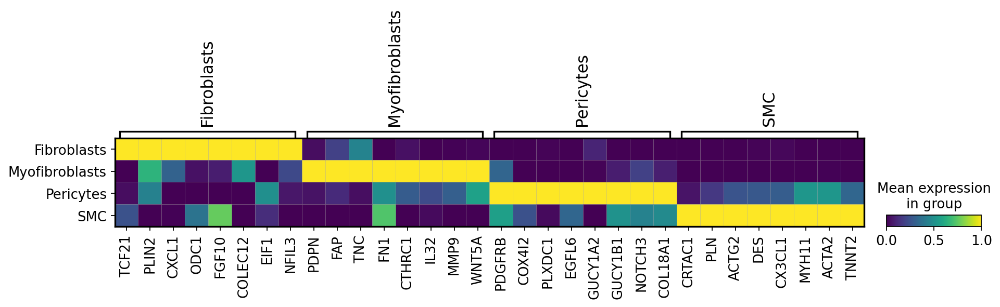

In [30]:
## custom heatmap
# matrixplot with marker genes
celltype_markers={'Fibroblasts' : ['TCF21','PLIN2','CXCL1','ODC1','FGF10','COLEC12','EIF1','NFIL3'],
                  'Myofibroblasts' : ['PDPN','FAP','TNC','FN1','CTHRC1','IL32','MMP9','WNT5A'],
                  'Pericytes' : ['PDGFRB','COX4I2','PLXDC1','EGFL6','GUCY1A2','GUCY1B1','NOTCH3','COL18A1'],
                  'SMC' : ['CRTAC1','PLN','ACTG2','DES','CX3CL1','MYH11','ACTA2','TNNT2']
}
sc.pl.matrixplot(adata, celltype_markers, groupby = 'cell_type',standard_scale='var', dendrogram=False,
                     save='curated_markers.pdf' )

### Feature plot of key Myofibroblast marker genes

In [31]:
myofib_marker = ['CTHRC1','FAP','PDPN','FN1','IL32','MMP9','WNT5A']

In [32]:
from matplotlib import colors
grey_red = colors.LinearSegmentedColormap.from_list("grouping", ["lightgray", "red", "darkred"], N=128)

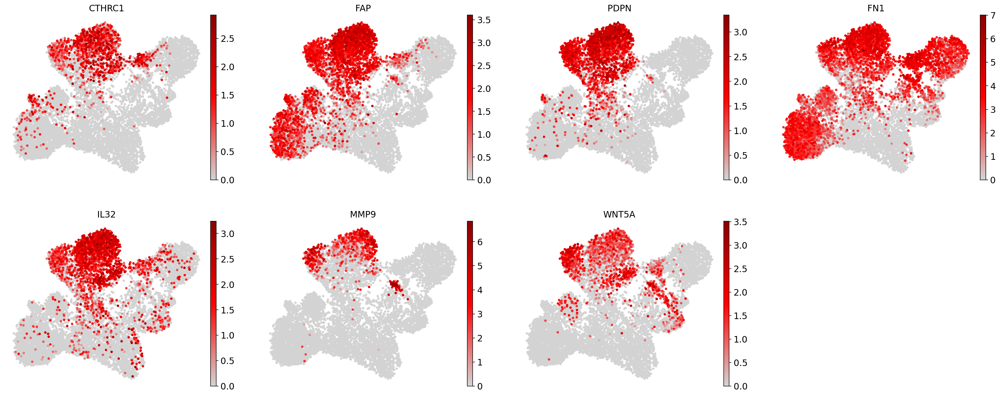

In [33]:
sc.pl.umap(adata, color =  myofib_marker, frameon = False, cmap = grey_red, size = 60, vmin = 0,
          save = '_myofib_marker.pdf')

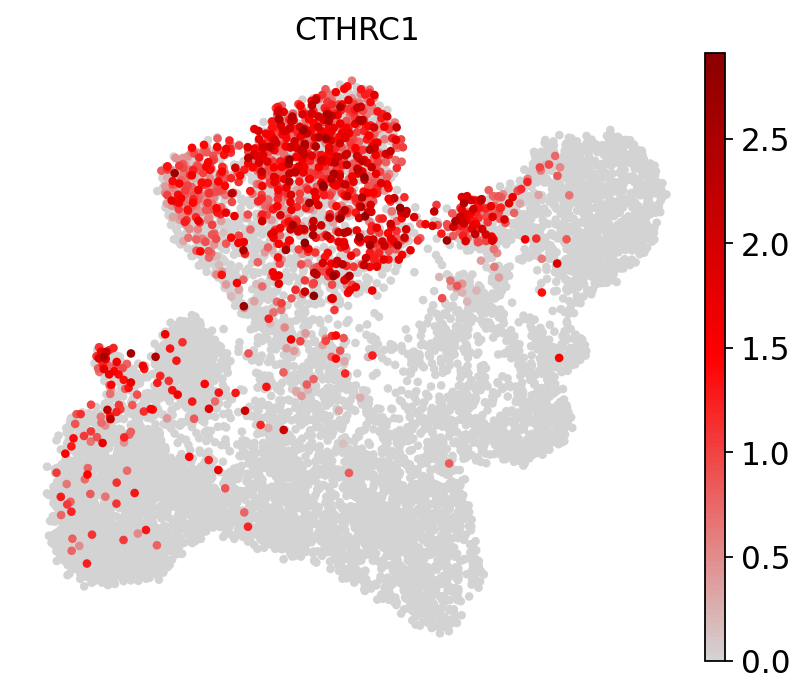

In [34]:
sc.pl.umap(adata, color =  ['CTHRC1'], frameon = False, cmap = grey_red, size = 60, vmin = 0,
          save = '_myofib_marker_CTHRC1.pdf')

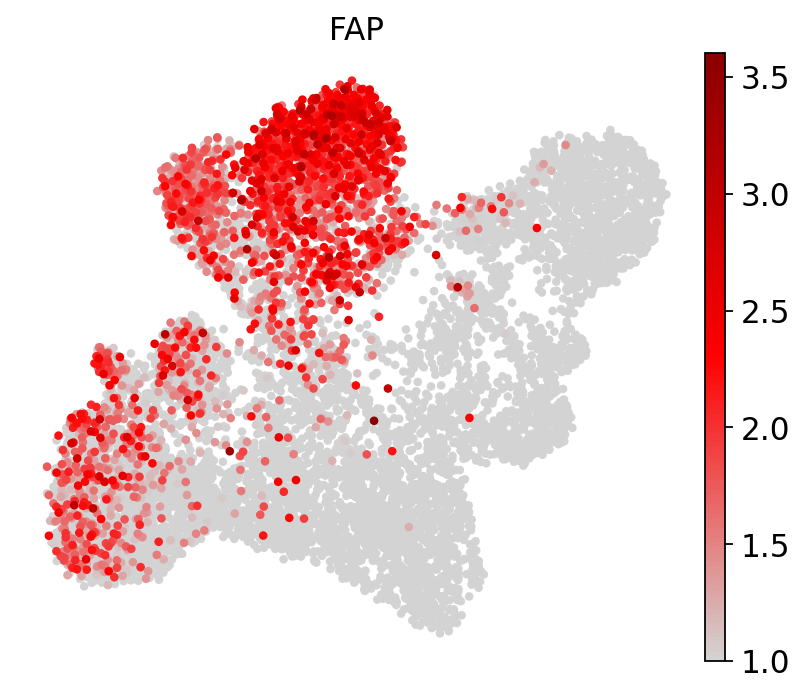

In [35]:
sc.pl.umap(adata, color =  ['FAP'], frameon = False, cmap = grey_red, size = 60, vmin = 1,
          save = '_myofib_marker_FAP.pdf')

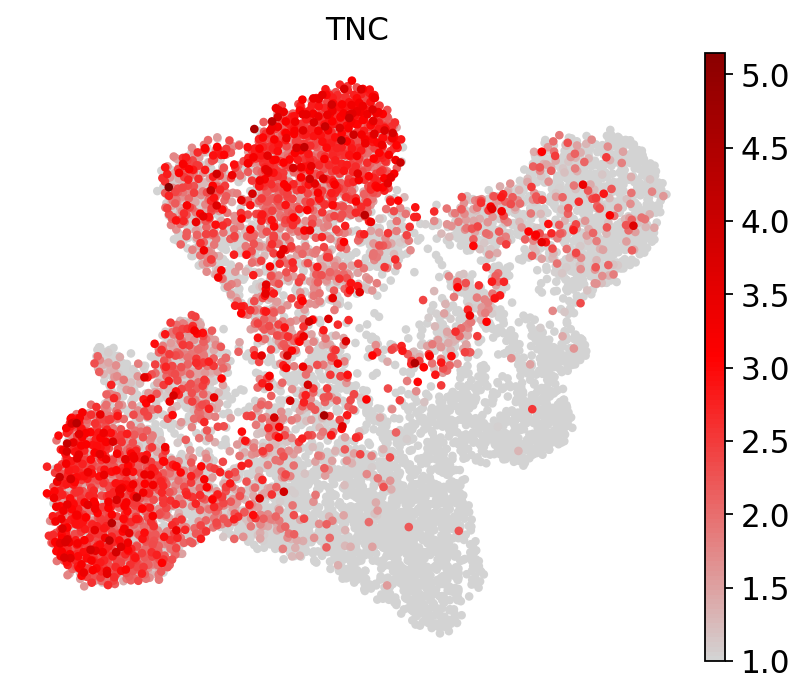

In [36]:
sc.pl.umap(adata, color =  ['TNC'], frameon = False, cmap = grey_red, size = 60, vmin = 1,
          save = '_myofib_marker_TNC.pdf')

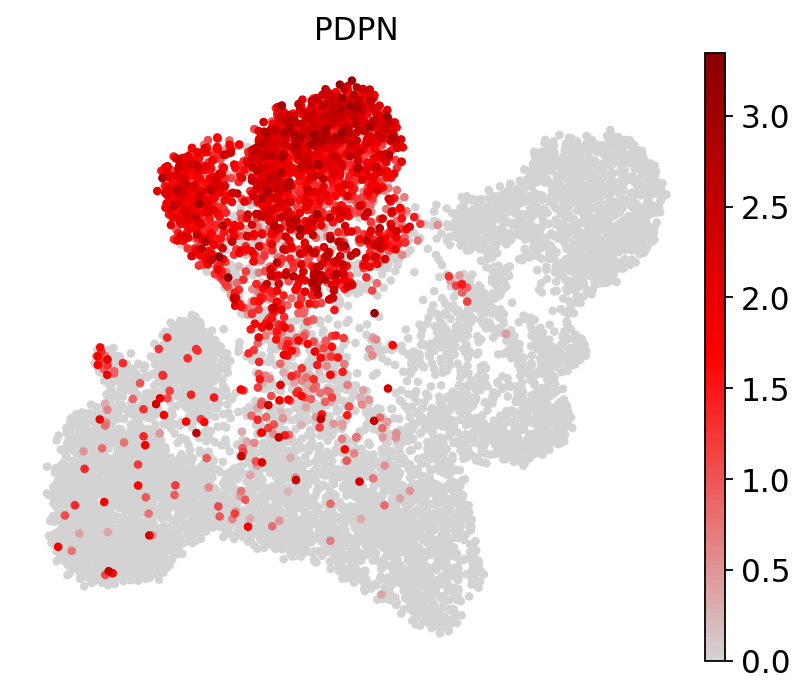

In [37]:
sc.pl.umap(adata, color =  ['PDPN'], frameon = False, cmap = grey_red, size = 60, vmin = 0,
           save = '_myofib_marker_PDPN.pdf')

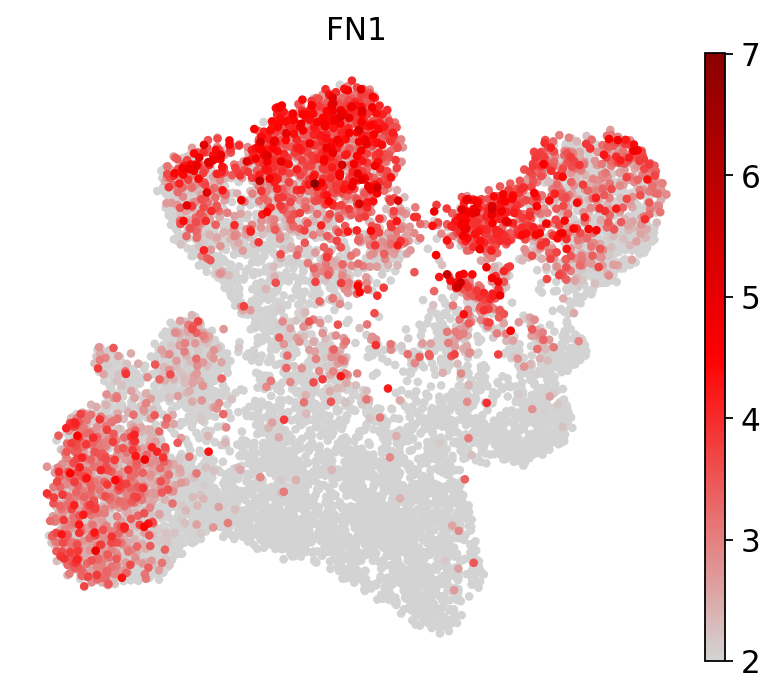

In [38]:
sc.pl.umap(adata, color =  ['FN1'], frameon = False, cmap = grey_red, size = 60, vmin = 2,
           save = '_myofib_marker_FN1.pdf')

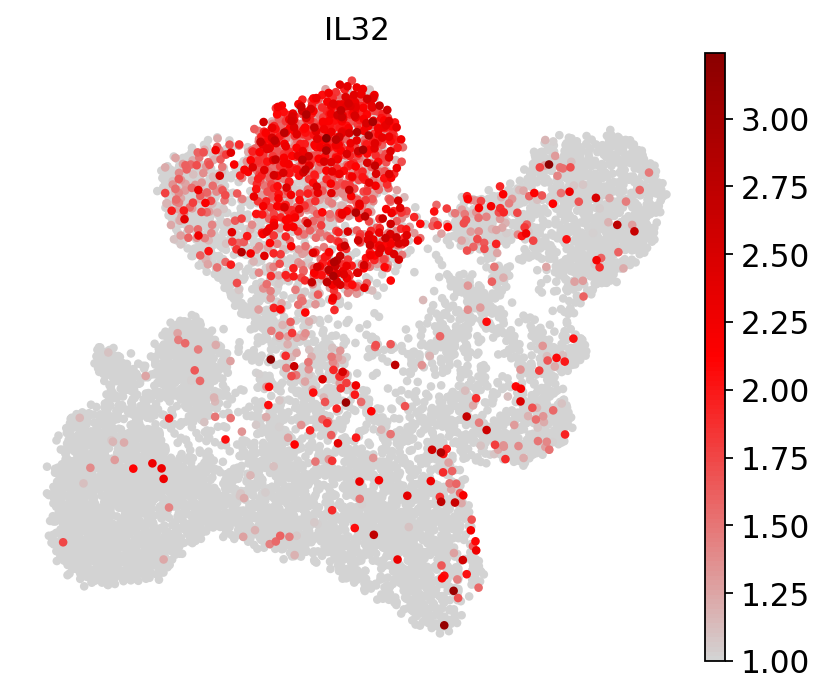

In [39]:
sc.pl.umap(adata, color =  ['IL32'], frameon = False, cmap = grey_red, size = 60, vmin = 1,
           save = '_myofib_marker_IL32.pdf')

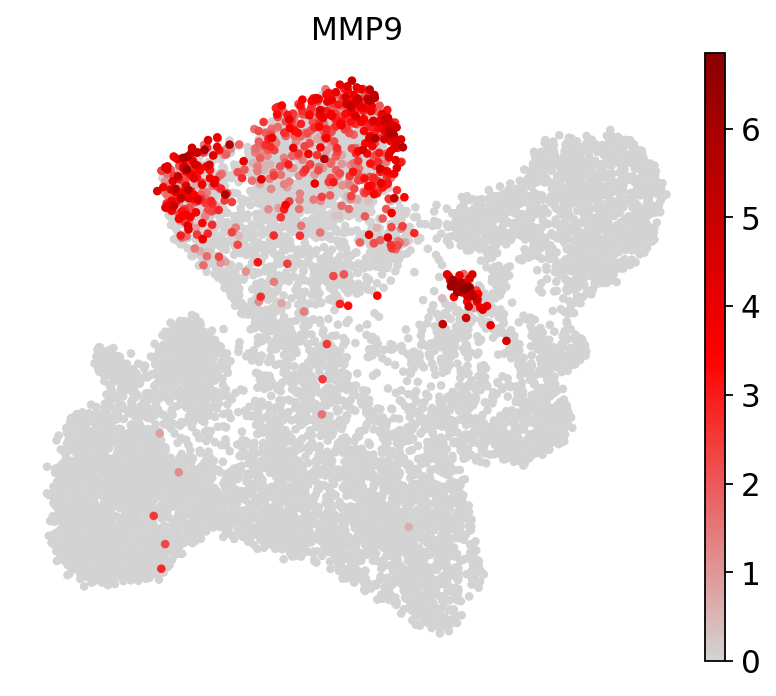

In [40]:
sc.pl.umap(adata, color =  ['MMP9'], frameon = False, cmap = grey_red, size = 60, vmin = 0,
           save = '_myofib_marker_MMP9.pdf')

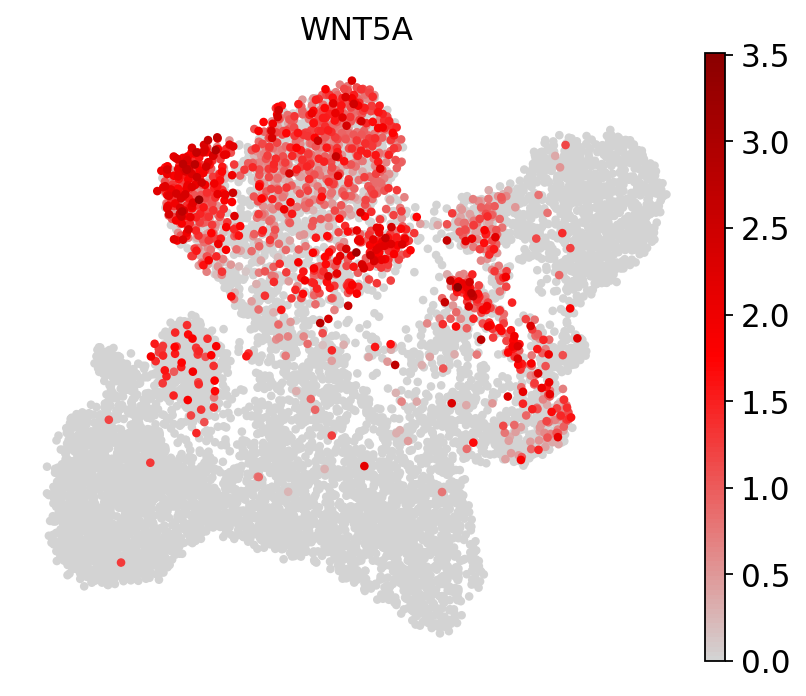

In [41]:
sc.pl.umap(adata, color =  ['WNT5A'], frameon = False, cmap = grey_red, size = 60, vmin = 0,
           save = '_myofib_marker_WNT5A.pdf')

### Feature plot of Pericyte and SMC marker genes

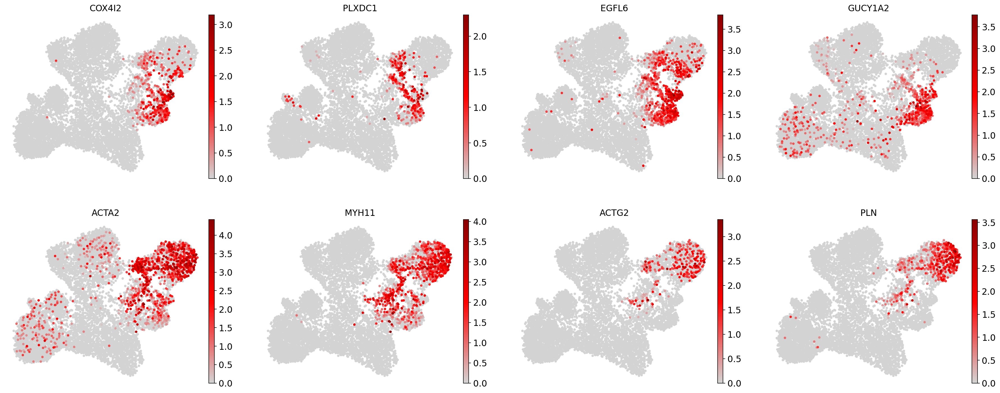

In [42]:
sc.pl.umap(adata, color =  ['COX4I2','PLXDC1','EGFL6','GUCY1A2', ## pericytes
                            'ACTA2','MYH11','ACTG2','PLN' ## smooth muscle cells 
                            ], frameon = False, cmap = grey_red, size = 60, vmin = 0,
          save = '_smc_peri_marker.pdf')

### Scorings: in vivo Myofibroblast signature

In [43]:
fibs = adata[adata.obs.cell_type_group.isin(['Fibroblasts'])]

In [44]:
marker_folder = '/home/niklas/projects/niche_environments_FIBROSIS/HUMAN_invivo/01_data/marker_table/220202_CPC_IPF_reference_mesenchyme_markers_table_celltype_OVERALL.csv'
marker_table = pd.read_csv(marker_folder, sep = ',', index_col = None)
marker_table.head(5)

,Unnamed: 0,gene,score,logfoldchange,pval,pval_adj,cell_type,pct_cell_type,pct_background
0,9,CCBE1,31.372486,3.400554,4.802889e-216,2.961509e-212,Lipofibroblasts,0.365268,0.060219
1,25,NEBL,24.196615,3.376806,2.414902e-129,4.803396e-126,Lipofibroblasts,0.277855,0.038817
2,27,CACNA1D,23.788694,3.301597,4.372718e-125,7.489616e-122,Lipofibroblasts,0.284615,0.053240
3,3,ROBO2,34.325450,2.812416,3.274546e-258,5.047794e-254,Lipofibroblasts,0.465501,0.156597
4,0,LIMCH1,43.271720,2.722081,0.000000e+00,0.000000e+00,Lipofibroblasts,0.558508,0.160784


In [45]:
marker_table['cell_type'].value_counts()

adventitial Fibroblasts    1052
Lipofibroblasts             689
Myofibroblasts              621
SMCs                        511
Pericytes                   444
Name: cell_type, dtype: int64

In [46]:
## what to score 
cell_type = 'Myofibroblasts'
s_name = 'Myofibroblast signature'

In [47]:
score_genes = marker_table[marker_table['cell_type'] == cell_type]
score_genes = score_genes[score_genes['logfoldchange'] > 0.5]
score_genes = score_genes[score_genes['pct_background'] < 0.25]

In [48]:
score_genes_list = score_genes['gene'].to_list()

In [50]:
sc.tl.score_genes(fibs, gene_list = score_genes_list, score_name = s_name)

computing score 'Myofibroblast signature'


Trying to set attribute `.obs` of view, copying.


    finished: added
    'Myofibroblast signature', score of gene set (adata.obs).
    787 total control genes are used. (0:00:00)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Saving to /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint
/mesenchyme_subset/boxplot_myofibroblast_score_sample.pdf

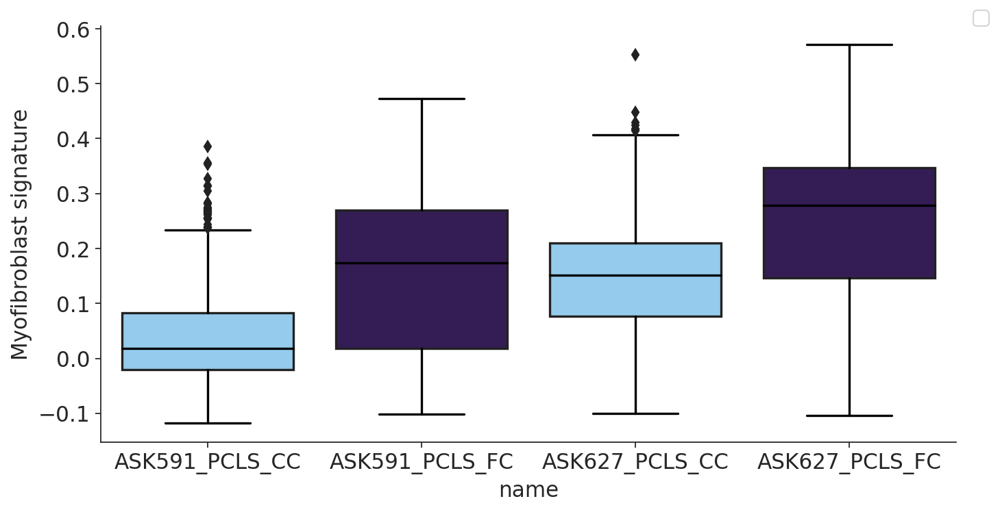

In [53]:
xlabel = 'name'
cols = fibs.uns['%s_colors' %'treatment']
score = sc.get.obs_df(fibs, keys = [s_name, xlabel], layer = None, use_raw = True)
sct.plot.gene_boxplot(score, score = s_name, xlabel = xlabel, figsize = (10, 5), palette = cols, width = 0.8,
                      save = fig_dir + 'boxplot_myofibroblast_score_sample.pdf')


In [54]:
ask627_score_fc = score[score['name'].isin(['ASK627_PCLS_FC'])]['Myofibroblast signature'].to_list()
ask627_score_cc = score[score['name'].isin(['ASK627_PCLS_CC'])]['Myofibroblast signature'].to_list()
ask591_score_fc = score[score['name'].isin(['ASK591_PCLS_FC'])]['Myofibroblast signature'].to_list()
ask591_score_cc = score[score['name'].isin(['ASK591_PCLS_CC'])]['Myofibroblast signature'].to_list()

In [55]:
import scipy.stats as stats
#perform the Mann-Whitney U test for ASK591
stats.mannwhitneyu(ask591_score_cc, ask591_score_fc, alternative='two-sided')

MannwhitneyuResult(statistic=191756.0, pvalue=8.529218667424752e-59)

In [56]:
#perform the Mann-Whitney U test for ASK627
stats.mannwhitneyu(ask627_score_cc, ask627_score_fc, alternative='two-sided')

MannwhitneyuResult(statistic=1993022.0, pvalue=5.31940992529932e-187)

### Scorings: in vivo activated Pericyte signature

In [57]:
smc_peri = adata[adata.obs.cell_type.isin(['Pericytes'])]

In [58]:
marker_folder = '/home/niklas/data/gene_lists/schiller_overall_marker.txt'
marker_table = pd.read_csv(marker_folder, sep = '\t', index_col = None)
marker_table.head(5)

,gene,score,log_FC,p_val,p_val_adj,cluster,Unnamed: 6
0,C1QB,306.86120,5.509877,0.0,0.0,AM,NaN
1,C1QA,306.64157,5.274090,0.0,0.0,AM,NaN
2,APOC1,299.39640,5.060331,0.0,0.0,AM,NaN
3,FTL,296.24066,3.904188,0.0,0.0,AM,NaN
4,ACP5,286.55603,3.825475,0.0,0.0,AM,NaN


In [59]:
## what to score 
cell_type = 'Pericytes activated'
s_name = 'activated Pericytes signature'

In [60]:
score_genes = marker_table[marker_table['cluster'] == cell_type]
score_genes = score_genes[score_genes['log_FC'] > 2]
score_genes = score_genes[score_genes['p_val_adj'] < 0.001]

In [61]:
score_genes_list = score_genes['gene'].to_list()

In [62]:
len(score_genes_list)

319

In [63]:
sc.tl.score_genes(smc_peri, gene_list = score_genes_list, score_name = s_name)

computing score 'activated Pericytes signature'


Trying to set attribute `.obs` of view, copying.


    finished: added
    'activated Pericytes signature', score of gene set (adata.obs).
    1029 total control genes are used. (0:00:00)


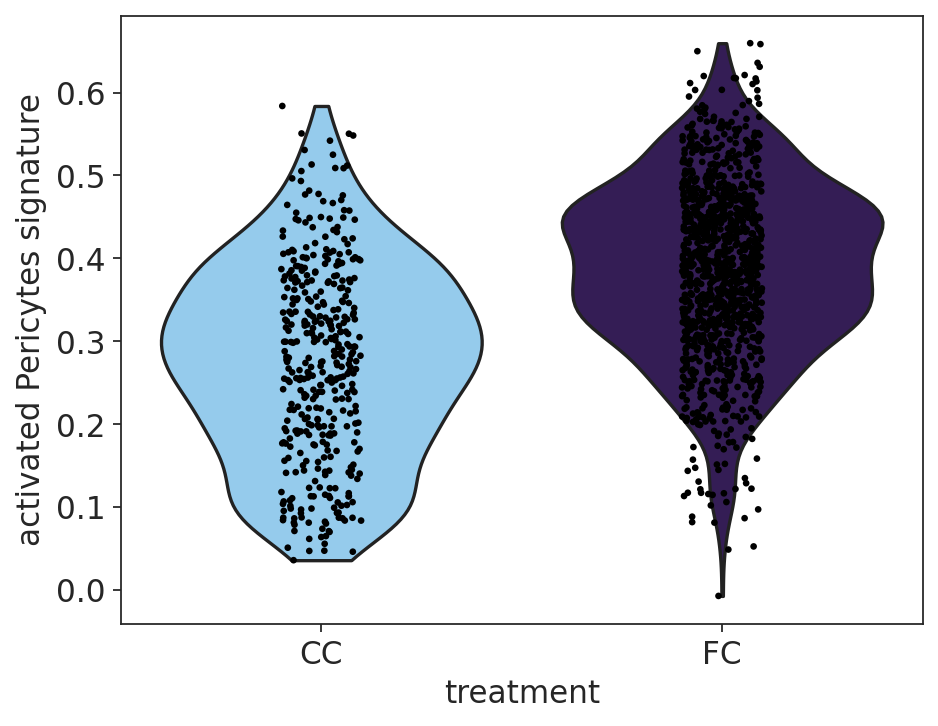

In [64]:
sc.pl.violin(smc_peri, keys = [s_name], groupby = 'treatment', size = 3, layer=None, scale='width')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Saving to /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint
/mesenchyme_subset/boxplot_activated_pericyte_score_sample.pdf

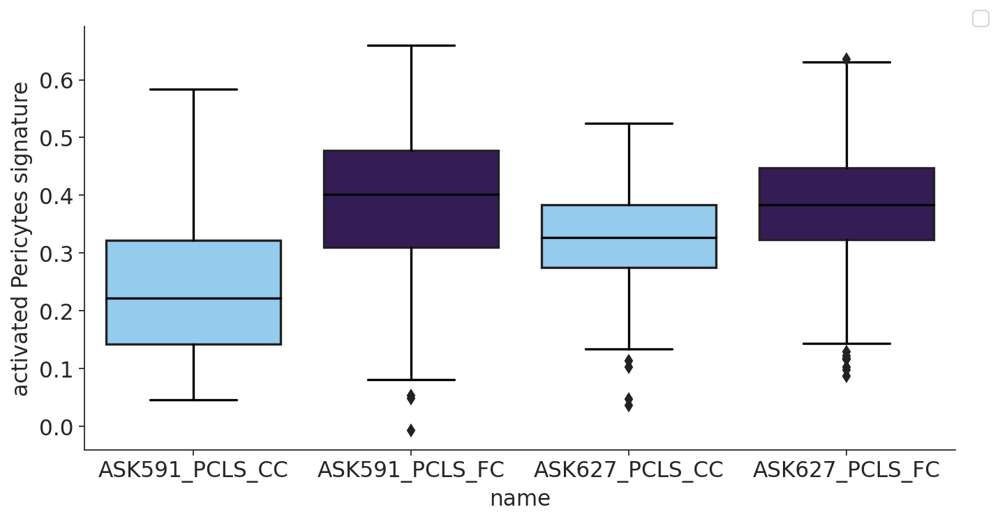

In [65]:
xlabel = 'name'
cols = smc_peri.uns['%s_colors' %'treatment']
score = sc.get.obs_df(smc_peri, keys = [s_name, xlabel], layer = None, use_raw = True)
sct.plot.gene_boxplot(score, score = s_name, xlabel = xlabel, figsize = (10, 5), palette = cols, width = 0.8,
                      save = fig_dir + 'boxplot_activated_pericyte_score_sample.pdf')

In [66]:
ask627_score_fc = score[score['name'].isin(['ASK627_PCLS_FC'])]['activated Pericytes signature'].to_list()
ask627_score_cc = score[score['name'].isin(['ASK627_PCLS_CC'])]['activated Pericytes signature'].to_list()
ask591_score_fc = score[score['name'].isin(['ASK591_PCLS_FC'])]['activated Pericytes signature'].to_list()
ask591_score_cc = score[score['name'].isin(['ASK591_PCLS_CC'])]['activated Pericytes signature'].to_list()

In [67]:
import scipy.stats as stats
#perform the Mann-Whitney U test for ASK591
stats.mannwhitneyu(ask591_score_cc, ask591_score_fc, alternative='two-sided')

MannwhitneyuResult(statistic=27669.0, pvalue=8.00947966025862e-44)

In [68]:
#perform the Mann-Whitney U test for ASK627
stats.mannwhitneyu(ask627_score_cc, ask627_score_fc, alternative='two-sided')

MannwhitneyuResult(statistic=26797.0, pvalue=6.880288777055892e-12)